# Data Degradation
Prepare noisy data for the models in the next notebooks.

## Libraries & Drive Access & some constants

In [2]:
!pip install astra-toolbox

import os
import sys
import time
import random
import shutil
import numpy as np
import torch
import torchvision
from pathlib import Path
from dataclasses import dataclass, field
from typing import List, Tuple, Any
from datasets import load_dataset, Dataset, DatasetDict, concatenate_datasets
from google.colab import drive
from PIL import Image

# for Data & Image check
import json
import math
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from datasets import load_from_disk, load_dataset_builder
from collections import Counter

drive.mount('/content/drive')
os.environ["CACHE"] = "/content/cache"

BASE_DIR = Path("/content/drive/MyDrive/Computational Imaging")
sys.path.append(str(BASE_DIR))

from IPPy.IPPy.operators import Blurring
import IPPy.IPPy.utilities as IPPy_utils

# Constants
DEVICE = IPPy_utils.get_device()
BATCHED = True
BATCH_SIZE = 128
INDICES = True

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 66.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.5/3.5 MB 71.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 200.9/200.9 MB 6.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 39.7/39.7 MB 20.0 MB/s eta 0:00:00
Mounted at /content/drive


## Basic functions and configuration
Configurations of parameters like noise, type of blur, dataset and samples per class

In [3]:
@dataclass(frozen=True)
class Config:
  seed: int = 42
  dataset_name: str = "benjamin-paine/imagenet-1k-256x256"
  target_classes: List[int] = (0, 10, 100, 200) # default_factory with lambda to have each istance of Config it's own target_classes
  samples_per_class: int = 1300 #max

  drive_output_dir: Path = BASE_DIR / "dataset"

  # Forward operator parameters
  img_shape: Tuple[int, int, int] = (3, 256, 256) # img type, (C,H,W)
  blur_kernel_type: str = "gaussian"
  blur_kernel_size: int = 9
  blur_sigma: float = 2.0
  motion_angle: float = 45.0 # unused rn

  noise_levels: List[float] = (0.005, 0.01, 0.05, 0.1)
  device: str = DEVICE

def set_seed(seed: int = 42) -> None:
  """ Set seed for reproducibility """
  random.seed(seed)
  np.random.seed(seed)
  torch.manual_seed(seed)
  torch.cuda.manual_seed_all(seed)
  torch.backends.cudnn.deterministic = True
  torch.backends.cudnn.benchmark = False
  torch.use_deterministic_algorithms(True, warn_only=True)

# Image transformation
pil_to_tensor = torchvision.transforms.ToTensor()
tensor_to_pil = torchvision.transforms.ToPILImage()

## Forward Model

In [4]:
def forward_model( image_batch: dict[str, list[Any]],
                  indices: list[int], K: Blurring, noise_levels: list[float],
                   device: str, base_seed: int) -> dict[str, Any]:
  """
  Apply  y = K(x) + e

  Parameters:
    image_batch: series of BATCH_SIZE images from the dataset, in format { "image": [img1, ...], "label": [0, ...] }
    indices: list of indices of the images from the dataset, for assuring determinism later on in the function. List as image_batch are multiple images
    K: blurring operator
    noise_levels: list of config.noise_levels
    device: used for GPU or apple-cpu optimization, if available
    base_seed: assuring that different images(and level of noise) have different type of noise, but still deterministic
  """
  batch_images = image_batch.get("image", [])
  batch_size = len(batch_images)

  # in case of empty batches
  # if batch_size == 0:
  #     output_dict = {f"y_{int(round(sigma_n * 1000)):03d}": [] for sigma_n in noise_levels}
  #     output_dict["x"] = []
  #     return output_dict

  # convert into RGB in case it's not
  tensor_list = []
  for img in batch_images:
    if img.mode != "RGB":
      img = img.convert("RGB")
    tensor_list.append(pil_to_tensor(img))

  # blur
  x_batch = torch.stack(tensor_list).to(device).float()
  y_clean = K(x_batch)

  # noise
  output_dict = {f"y_{int(round(sigma_n * 1000)):03d}": [] for sigma_n in noise_levels}
  output_dict["x"] = batch_images

  for i, idx in enumerate(indices):
    img_clean = y_clean[i]

    for sigma_n in noise_levels:
      # specific seed for each image, should be enough to not have collisions
      torch.manual_seed(base_seed + idx + int(sigma_n * 1000))

      y_noisy = img_clean + IPPy_utils.gaussian_noise(img_clean, sigma_n)

      y_noisy_uint8 = (y_noisy * 255.0).clamp(0, 255).to(torch.uint8)
      y_noisy_pil = tensor_to_pil(y_noisy_uint8.cpu())

      key = f"y_{int(round(sigma_n * 1000)):03d}"
      output_dict[key].append(y_noisy_pil)

  return output_dict

## Dataset loading and preprocessing

In [ ]:
config = Config()
set_seed(config.seed)

# definition of the blur operator
blur = Blurring(
  img_shape=config.img_shape,
  kernel_type=config.blur_kernel_type,
  kernel_size=config.blur_kernel_size,
  kernel_variance=config.blur_sigma**2
)

# reading train part of the dataset, collecting samples until config.samples_per_class is satisfied
iterable_ds = load_dataset(config.dataset_name, split="train", streaming=True)
class_datasets = []
for cls in config.target_classes:
  cls_iter = iterable_ds.filter(lambda x, c=cls: x["label"] == c)
  cls_ds = Dataset.from_generator(
      lambda s=cls_iter.take(config.samples_per_class): (yield from s),
      features=iterable_ds.features
  )
  class_datasets.append(cls_ds)
ds = concatenate_datasets(class_datasets)

# doing the degradation
ds_degraded = ds.map(
  forward_model,
  batched=BATCHED,
  batch_size=BATCH_SIZE,
  with_indices=INDICES,
  remove_columns=["image"],
  fn_kwargs={
    "K": blur,
    "noise_levels": config.noise_levels,
    "device": config.device,
    "base_seed": config.seed
  }
)

Resolving data files:   0%|          | 0/40 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/40 [00:00<?, ?it/s]

## Data separation & saving

In [ ]:
# splitting the dataset into train 80% - validation 10% - testing 10%
train_test_split = ds_degraded.train_test_split(test_size=0.2, seed=config.seed, stratify_by_column="label")
val_test_split = train_test_split['test'].train_test_split(test_size=0.5, seed=config.seed, stratify_by_column="label")

final_dataset = DatasetDict({
  'train': train_test_split['train'],
  'validation': val_test_split['train'],
  'test': val_test_split['test']
})

# saving into drive
config.drive_output_dir.mkdir(parents=True, exist_ok=True)
final_dataset.save_to_disk(str(config.drive_output_dir))

# saving the class names
builder = load_dataset_builder(config.dataset_name)
class_names = builder.info.features["label"].names
id2label = {cls: class_names[cls] for cls in config.target_classes}
with open(config.drive_output_dir / "labels.json", "w") as f:
    json.dump(id2label, f, indent=2)

Saving the dataset (0/4 shards):   0%|          | 0/4160 [00:00<?, ? examples/s]

Saving the dataset (0/1 shards):   0%|          | 0/520 [00:00<?, ? examples/s]

Saving the dataset (0/1 shards):   0%|          | 0/520 [00:00<?, ? examples/s]

Resolving data files:   0%|          | 0/40 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/40 [00:00<?, ?it/s]

## Data & Image check

Dataset caricato da: /content/drive/MyDrive/Computational Imaging/dataset


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:112: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


README.md:   0%|          | 0.00/88.1k [00:00<?, ?B/s]

Resolving data files:   0%|          | 0/40 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/40 [00:00<?, ?it/s]

=== Split sizes ===
       train:  4160 samples
  validation:   520 samples
        test:   520 samples
       TOTAL:  5200 samples

=== Label distribution ===
  train: {0: 1040, 10: 1040, 100: 1040, 200: 1040}
  validation: {0: 130, 10: 130, 100: 130, 200: 130}
  test: {0: 130, 10: 130, 100: 130, 200: 130}

=== Columns ===
  ['label', 'y_005', 'y_010', 'y_050', 'y_100', 'x']

=== Pixel value ranges (first 5 train samples) ===
  x: min=0, max=255, dtype=uint8
  y_005: min=0, max=255, dtype=uint8
  y_010: min=0, max=255, dtype=uint8
  y_050: min=0, max=255, dtype=uint8
  y_100: min=0, max=255, dtype=uint8

=== Noise level verification (mean over 20 samples) ===
  y_005: expected=0.005  measured=0.002581 ± 0.000353
  y_010: expected=0.010  measured=0.004624 ± 0.000775
  y_050: expected=0.050  measured=0.022103 ± 0.003980
  y_100: expected=0.100  measured=0.043937 ± 0.007809

=== Blur MSE ===
Blur MSE: 0.005527446512132883

=== Image Shape ===
x (256, 256, 3)
y_005 (256, 256, 3)
y_010 (25

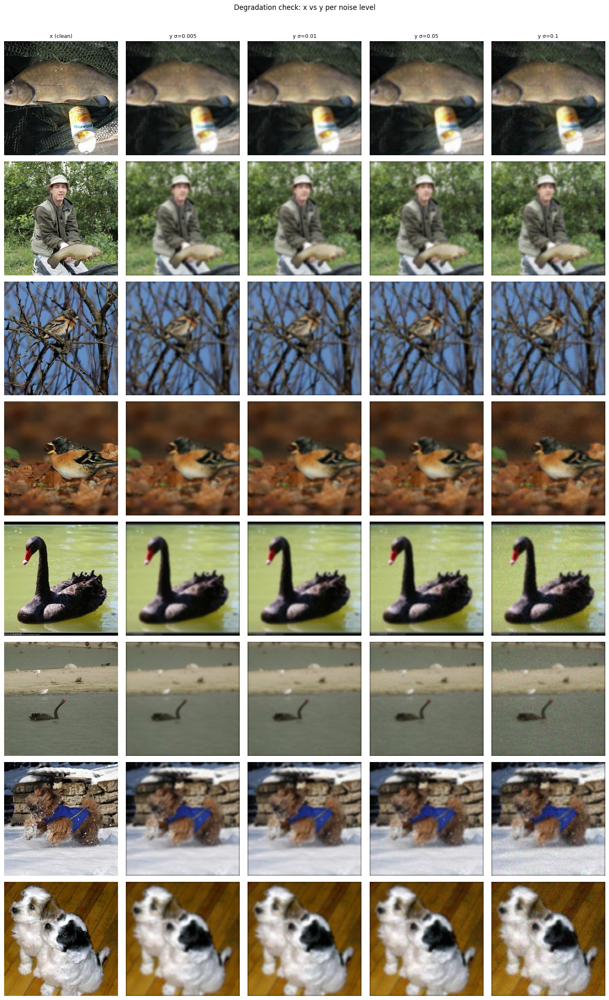

In [5]:
try:
  # if this is executed right after the cells above, i do not need to re-define variables
  config
except NameError:
  print("==================================")
  # if "Dataset loading and preprocessing" and "Data separation & Saving" cells are not executed
  config = Config()
  set_seed(config.seed)

  blur = Blurring(
    img_shape=config.img_shape,
    kernel_type=config.blur_kernel_type,
    kernel_size=config.blur_kernel_size,
    kernel_variance=config.blur_sigma**2
  )

  final_dataset = load_from_disk(str(config.drive_output_dir))
  print(f"Dataset caricato da: {config.drive_output_dir}")


  # To keep the environment state perfectly consistent, we merge the various splits of `final_dataset` to recreate the `ds_degraded` variable
  from datasets import concatenate_datasets
  ds_degraded = concatenate_datasets([
      final_dataset['train'],
      final_dataset['validation'],
      final_dataset['test']
  ])


# Let's read the dataset's metadata so that these variables are always available in the environment
builder = load_dataset_builder(config.dataset_name)
class_names = builder.info.features["label"].names

# for label of the class used
if (config.drive_output_dir / "labels.json").exists():
  # reading from the file on drive
  with open(config.drive_output_dir / "labels.json") as f:
    id2label = json.load(f)
    id2label = {int(k): v for k, v in id2label.items()}
else:
  # reading from the official dataset
  id2label = {cls: class_names[cls] for cls in config.target_classes}

print("=== Split sizes ===")
for split, ds_split in final_dataset.items():
  print(f"  {split:>10}: {len(ds_split):>5} samples")

total = sum(len(v) for v in final_dataset.values())
print(f"  {'TOTAL':>10}: {total:>5} samples")

print("\n=== Label distribution ===")
for split, ds_split in final_dataset.items():
  counts = Counter(ds_split['label'])
  print(f"  {split}: { {k: counts[k] for k in sorted(counts)} }")

print("\n=== Columns ===")
print(" ", final_dataset['train'].column_names)

print("\n=== Pixel value ranges (first 5 train samples) ===")
sample = final_dataset['train'].select(range(5))
for col in ['x'] + [f"y_{int(round(sigma_n * 1000)):03d}" for sigma_n in config.noise_levels]:
  vals = [np.array(img) for img in sample[col]]
  arr = np.stack(vals)
  print(f"  {col}: min={arr.min()}, max={arr.max()}, dtype={arr.dtype}")

#  verify ||e|| / ||Kx|| ≈ sigma_n for each level of noise
print("\n=== Noise level verification (mean over 20 samples) ===")
sample = final_dataset['train'].select(range(20))

x_tensors   = torch.stack([pil_to_tensor(img) for img in sample['x']]).float().to(config.device)
y_clean_est = blur(x_tensors)  # Kx

for sigma_n in config.noise_levels:
  key = f"y_{int(round(sigma_n * 1000)):03d}"
  y_tensors = torch.stack([pil_to_tensor(img) for img in sample[key]]).float().to(config.device)
  noise     = y_tensors - y_clean_est
  measured_sigma = noise.std(dim=(1, 2, 3))
  print(f"  {key}: expected={sigma_n:.3f}  measured={measured_sigma.mean():.6f} ± {measured_sigma.std():.6f}")

print("\n=== Blur MSE ===")
mse = ((x_tensors - y_clean_est) ** 2).mean()
print("Blur MSE:", mse.item())

print("\n=== Image Shape ===")
sample = final_dataset["train"][0]

for key in ["x"] + [
    f"y_{int(round(s*1000)):03d}"
    for s in config.noise_levels
]:
    print(key, np.array(sample[key]).shape)

# === Plotting ===
cols_to_show = ['x'] + [f"y_{int(round(s*1000)):03d}" for s in config.noise_levels]
titles       = ['x (clean)', *[f"y σ={s}" for s in config.noise_levels]]
n_per_class  = 2

n_rows = len(config.target_classes) * n_per_class
n_cols = len(cols_to_show)

fig, axes = plt.subplots(
    n_rows, n_cols,
    figsize=(n_cols * 3, n_rows * 3)
)

labels_array = np.array(final_dataset['train']['label'])

row = 0
for cls in config.target_classes:
    all_indices = np.where(labels_array == cls)[0][:n_per_class].tolist()

    for idx in all_indices:
        sample_row = final_dataset['train'][int(idx)]
        for col_i, col in enumerate(cols_to_show):
            ax = axes[row][col_i]
            ax.imshow(sample_row[col])
            ax.axis('off')
            if col_i == 0:
                ax.set_ylabel(f"{id2label[cls]}", fontsize=9, rotation=90, labelpad=4)
            if row == 0:
                ax.set_title(titles[col_i], fontsize=9)
        row += 1

plt.suptitle("Degradation check: x vs y per noise level", fontsize=12, y=1.01)
plt.tight_layout()
plt.savefig(str(config.drive_output_dir / "image_check.png"), dpi=100, bbox_inches='tight')
plt.show()

## TpV Function Definition

This cell contains the definition of the tpv method for solving the deblur and denoise problem

In [6]:
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
import numpy as np
from skimage.metrics import structural_similarity as ssim_metric
from skimage.metrics import peak_signal_noise_ratio as psnr_metric


def total_p_variation_loss(img, p=1.0):
    """ Computes the Total p-Variation regularization loss of the image """

    # Compute the absolute differences between adjacent pixels along the vertical axis (height)
    diff_h = torch.abs(img[:, :, 1:, :] - img[:, :, :-1, :])
    # Compute the absolute differences between adjacent pixels along the horizontal axis (width)
    diff_w = torch.abs(img[:, :, :, 1:] - img[:, :, :, :-1])

    # Add a small epsilon (1e-8) to prevent division by zero or NaN gradients (numerical stability)
    # Raise the differences to the power of 'p' and sum all the values
    tv_h = torch.pow(diff_h + 1e-8, p).sum()
    tv_w = torch.pow(diff_w + 1e-8, p).sum()

    # Return the total p-variation loss combining both vertical and horizontal components
    return tv_h + tv_w


def compute_metrics(x_pred, x_true):
    """
    Computes PSNR and SSIM metrics between the predicted and ground truth PyTorch tensors
    (assuming a batch size of B=1).
    """

    # Move the tensors from GPU to CPU, detach them from the computational graph,
    # and convert them to NumPy format (Height, Width, Channels) required by scikit-image
    img_pred = x_pred[0].cpu().detach().permute(1, 2, 0).numpy()
    img_true = x_true[0].cpu().detach().permute(1, 2, 0).numpy()

    # The image pixel values are in the range [0, 1] due to the initial tensor normalization
    psnr_val = psnr_metric(img_true, img_pred, data_range=1.0)

    # channel_axis=-1 indicates that the RGB channels are located in the last dimension
    ssim_val = ssim_metric(img_true, img_pred, data_range=1.0, channel_axis=-1)

    return psnr_val, ssim_val


def deblur_denoise_tpv(y, K, x_clean=None, lambda_tpv=0.01, p=1.0, num_iters=500, lr=0.01, device='cuda'):
    """
    Solves the inverse problem (deblurring and denoising) using Total p-Variation
    and tracks performance metrics over iterations.
    """

    # Initialize the target image 'x' as a clone of the degraded image 'y' (initial guess)
    x = y.clone().detach().to(device)

    # Enable gradient tracking for 'x', as this is the variable we want to optimize/update
    x.requires_grad_(True)

    # Initialize the Adam optimizer to update only the tensor 'x' with the given learning rate
    optimizer = torch.optim.Adam([x], lr=lr)

    # Dictionary for storing the "history" of the optimization (losses and metrics over time)
    history = {'loss': [], 'psnr': [], 'ssim': [], 'iters': []}

    # Main optimization loop
    for i in range(num_iters):
        # Reset the gradients of the optimizer to zero before each backward pass
        optimizer.zero_grad()

        # FORWARD PASS
        # Apply the degradation operator K (blur) to our current estimate 'x'
        y_hat = K(x)

        # Compute the Data Fidelity term: Mean Squared Error between the blurred estimate and the observed noisy image
        data_loss = 0.5 * F.mse_loss(y_hat, y, reduction='sum')

        # Compute the Regularization term: Total p-Variation loss
        tv_loss = total_p_variation_loss(x, p=p)

        # Combine both terms to get the total objective loss to minimize
        loss = data_loss + lambda_tpv * tv_loss

        # BACKWARD PASS
        # Compute the gradients of the loss with respect to all pixels in 'x'
        loss.backward()

        # Update the pixel values of 'x' based on the computed gradients
        optimizer.step()

        # Clip the pixel values of 'x' to ensure they remain in the valid image range [0, 1]
        # This operation is wrapped in torch.no_grad() because it shouldn't affect gradient tracking
        with torch.no_grad():
            x.clamp_(0, 1)

        # Track the total loss at every iteration
        history['loss'].append(loss.item())

        # Calculate and track visual metrics at regular intervals (every 10% of iterations) and at the last step
        if (i + 1) % (num_iters // 10) == 0 or i == num_iters - 1:
            if x_clean is not None:
                # If the ground truth image is available, compute PSNR and SSIM
                psnr_val, ssim_val = compute_metrics(x, x_clean)

                # Store the current iteration number and the computed metrics
                history['iters'].append(i + 1)
                history['psnr'].append(psnr_val)
                history['ssim'].append(ssim_val)
            else:
                # If ground truth is not provided, just print the current iteration and loss
                print(f"Iter {(i + 1):04d}/{num_iters} | Loss: {loss.item():.6f}")

    # Return the final optimized image (detached from the graph) and the optimization history
    return x.detach(), history


## Noise Level Setting and Image Retrival

In this cell we set the desired noise level; also we retrive and transform the image we want to evaluete and clean with TpV

In [15]:
#   Noise lavel that we want to use
noise_key = 'y_005'
#   Retrieve 1 image (e.g., sample 1) and create the tensors
sample = ds_degraded[19]
#   Noisy Tensor
y_noisy = pil_to_tensor(sample[noise_key]).unsqueeze(0).to(DEVICE)
#   Clean Tensor
x_clean = pil_to_tensor(sample['x']).unsqueeze(0).to(DEVICE)

## Deblur and Denoise with TpV Test

In this cell we test the TpV function on the image selected in the previous cell and visualize the results

Avvio Ottimizzazione TpV...



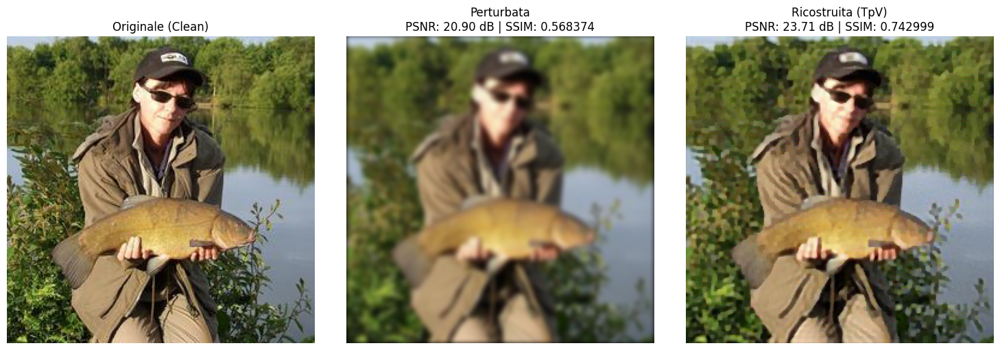

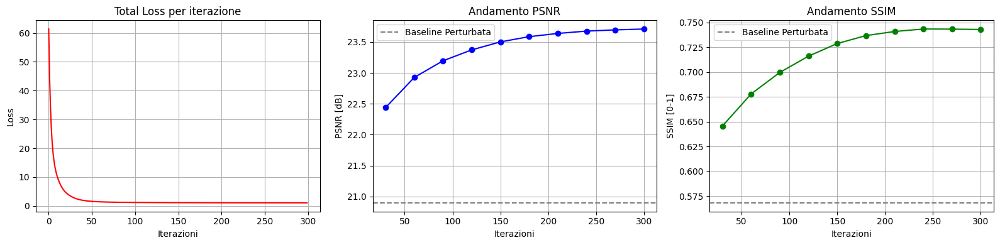

In [17]:
print("Starting TpV Optimization...\n")

# Run the deblurring and denoising algorithm
# The optimization will update 'x' for 300 iterations to minimize the loss function
x_reconstructed, history = deblur_denoise_tpv(
      y=y_noisy,          # The degraded (blurred and noisy) input image
      K=blur,             # The degradation operator (blur kernel)
      x_clean=x_clean,    # Ground truth image (used ONLY for calculating metrics, not for optimization)
      lambda_tpv=0.00001, # Regularization weight (how strongly to penalize noise/gradients)
      p=0.5,              # Power parameter for the non-convex Total p-Variation
      num_iters=300,      # Number of optimization steps
      lr=0.01,            # Learning rate for the Adam optimizer
      device=DEVICE       # Hardware accelerator (CPU or CUDA)
  )


# PLOTTING THE IMAGES (VISUAL COMPARISON)

# Convert the PyTorch tensors back to NumPy arrays (Height, Width, Channels) for visualization
img_clean_np = x_clean[0].cpu().permute(1, 2, 0).numpy()
img_noisy_np = y_noisy[0].cpu().permute(1, 2, 0).numpy()
img_recon_np = x_reconstructed[0].cpu().permute(1, 2, 0).numpy()

# Calculate the baseline metrics comparing the degraded image with the ground truth
psnr_start, ssim_start = compute_metrics(y_noisy, x_clean)

# Create a figure with 3 subplots side-by-side
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Subplot 1: The original, untouched clean image
axs[0].imshow(img_clean_np)
axs[0].set_title('Original (Clean)')
axs[0].axis('off')

# Subplot 2: The degraded input image with its baseline metrics
axs[1].imshow(img_noisy_np)
axs[1].set_title(f"Degraded\nPSNR: {psnr_start:.2f} dB | SSIM: {ssim_start:.6f}")
axs[1].axis('off')

# Subplot 3: The final reconstructed image with its final metrics achieved at the last iteration
axs[2].imshow(img_recon_np)
axs[2].set_title(f"Reconstructed (TpV)\nPSNR: {history['psnr'][-1]:.2f} dB | SSIM: {history['ssim'][-1]:.6f}")
axs[2].axis('off')

# Adjust layout to prevent overlap and display the figure
plt.tight_layout()
plt.show()


# PLOTTING THE OPTIMIZATION METRICS EVOLUTION

# Create a second figure with 3 subplots to track the learning curves
fig, axs = plt.subplots(1, 3, figsize=(16, 4))

# Subplot 1: Total Loss Evolution
# Shows how the objective function (Data Fidelity + TpV Regularization) decreases over iterations
axs[0].plot(history['loss'], color='red')
axs[0].set_title('Total Loss per Iteration')
axs[0].set_xlabel('Iterations')
axs[0].set_ylabel('Loss')
axs[0].grid(True)

# Subplot 2: PSNR Evolution
# Shows how the PSMR improves compared to the baseline
axs[1].plot(history['iters'], history['psnr'], marker='o', color='blue')
axs[1].axhline(y=psnr_start, color='gray', linestyle='--', label='Degraded Baseline')
axs[1].set_title('PSNR Evolution')
axs[1].set_xlabel('Iterations')
axs[1].set_ylabel('PSNR [dB]')
axs[1].legend()
axs[1].grid(True)

# Subplot 3: SSIM Evolution
# Shows how the SSIM improves compared to the baseline
axs[2].plot(history['iters'], history['ssim'], marker='o', color='green')
axs[2].axhline(y=ssim_start, color='gray', linestyle='--', label='Degraded Baseline')
axs[2].set_title('SSIM Evolution')
axs[2].set_xlabel('Iterations')
axs[2].set_ylabel('SSIM [0-1]')
axs[2].legend()
axs[2].grid(True)

# Adjust layout and display the metrics figure
plt.tight_layout()
plt.show()


## 2D "p" Evaluation Over One Image
In this cell we evaluate the SSIM and PSNR metrics of one image with "lmbda_tpv" fixed to find the best value of the parameter "p"

Avvio Tuning del parametro 'p' sull'immagine con rumore y_005...

--- Ottimizzazione con p = 0.10 ---
--- Ottimizzazione con p = 0.14 ---
--- Ottimizzazione con p = 0.19 ---
--- Ottimizzazione con p = 0.23 ---
--- Ottimizzazione con p = 0.28 ---
--- Ottimizzazione con p = 0.32 ---
--- Ottimizzazione con p = 0.37 ---
--- Ottimizzazione con p = 0.41 ---
--- Ottimizzazione con p = 0.46 ---
--- Ottimizzazione con p = 0.50 ---


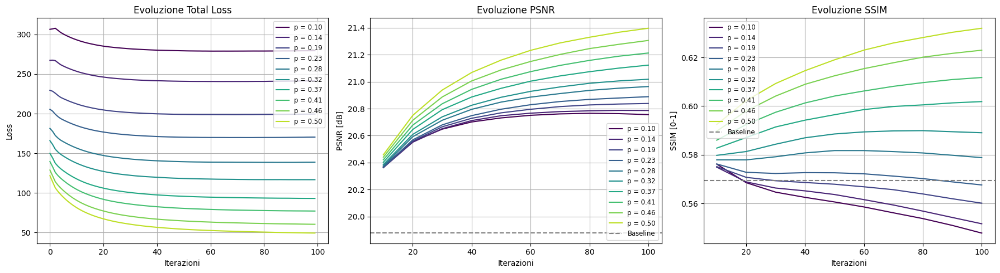

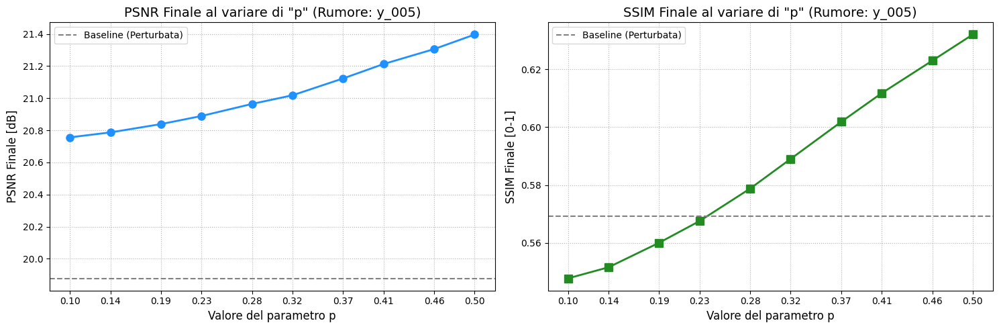

In [31]:
import matplotlib.cm as cm

# Calculate the baseline starting metrics between the degraded image and the ground truth
psnr_start, ssim_start = compute_metrics(y_noisy, x_clean)

# Generate an array of 10 'p' values evenly spaced between 0.1 and 0.5 (step size 0.05)
p_values = np.linspace(0.1, 0.5, 10)

# We use the round function to avoid Python's floating-point precision artifacts
for i in range(len(p_values)):
  p_values[i] = round(p_values[i], 2)

# Dictionary to store the results of the optimization for each tested 'p' value
results_p = {}

print(f"Starting Tuning for parameter 'p' on the image with noise level {noise_key}...\n")

for p_val in p_values:
    print(f"--- Optimization with p = {p_val:.2f} ---")

    # Run the TpV algorithm keeping all other hyperparameters constant
    x_reconstructed, history = deblur_denoise_tpv(
        y=y_noisy,
        K=blur,
        x_clean=x_clean,
        lambda_tpv=0.001,  # Keep the regularization weight constant
        p=p_val,           # Vary the 'p' parameter
        num_iters=100,     # Number of iterations for tuning
        lr=0.005,
        device=DEVICE
    )

    # Store the reconstructed image and its learning history for the current 'p'
    results_p[p_val] = {
        'x_reconstructed': x_reconstructed,
        'history': history
    }


# PLOT 1: METRICS EVOLUTION OVER ITERATIONS

fig, axs = plt.subplots(1, 3, figsize=(18, 5))

# Use a continuous colormap to smoothly color the lines representing different 'p' values
colors = cm.viridis(np.linspace(0, 0.9, len(p_values)))

for i, p_val in enumerate(p_values):
    history = results_p[p_val]['history']
    c = colors[i]
    label = f'p = {p_val:.2f}'

    # To avoid cluttering the graphs, we use continuous lines without scatter markers
    axs[0].plot(history['loss'], color=c, label=label)
    axs[1].plot(history['iters'], history['psnr'], color=c, label=label)
    axs[2].plot(history['iters'], history['ssim'], color=c, label=label)

# Setup subplots details (titles, labels, legends, grids)
axs[0].set_title('Total Loss Evolution')
axs[0].set_xlabel('Iterations')
axs[0].set_ylabel('Loss')
axs[0].legend(fontsize='small')
axs[0].grid(True)

axs[1].axhline(y=psnr_start, color='gray', linestyle='--', label='Baseline')
axs[1].set_title('PSNR Evolution')
axs[1].set_xlabel('Iterations')
axs[1].set_ylabel('PSNR [dB]')
axs[1].legend(fontsize='small')
axs[1].grid(True)

axs[2].axhline(y=ssim_start, color='gray', linestyle='--', label='Baseline')
axs[2].set_title('SSIM Evolution')
axs[2].set_xlabel('Iterations')
axs[2].set_ylabel('SSIM [0-1]')
axs[2].legend(fontsize='small')
axs[2].grid(True)

plt.tight_layout()
plt.show()


# PLOT 2: FINAL SUMMARY GRAPHS

# Extract the final metric value reached at the last iteration for each tested 'p'
final_psnr = [results_p[p_val]['history']['psnr'][-1] for p_val in p_values]
final_ssim = [results_p[p_val]['history']['ssim'][-1] for p_val in p_values]

fig, axs = plt.subplots(1, 2, figsize=(15, 5))

# Plot Final PSNR vs 'p' value
axs[0].plot(p_values, final_psnr, marker='o', markersize=8, color='dodgerblue', linewidth=2)
axs[0].axhline(y=psnr_start, color='gray', linestyle='--', label='Degraded Baseline')
axs[0].set_title(f'Final PSNR vs "p" (Noise: {noise_key})', fontsize=14)
axs[0].set_xlabel('Parameter "p" Value', fontsize=12)
axs[0].set_ylabel('Final PSNR [dB]', fontsize=12)
axs[0].grid(True, linestyle=':')
axs[0].set_xticks(p_values)
axs[0].legend()

# Plot Final SSIM vs 'p' value
axs[1].plot(p_values, final_ssim, marker='s', markersize=8, color='forestgreen', linewidth=2)
axs[1].axhline(y=ssim_start, color='gray', linestyle='--', label='Degraded Baseline')
axs[1].set_title(f'Final SSIM vs "p" (Noise: {noise_key})', fontsize=14)
axs[1].set_xlabel('Parameter "p" Value', fontsize=12)
axs[1].set_ylabel('Final SSIM [0-1]', fontsize=12)
axs[1].grid(True, linestyle=':')
axs[1].set_xticks(p_values)
axs[1].legend()

plt.tight_layout()
plt.show()


## 2D "lambda_tpv" (Regularization Parameter) Evaluation Over One Image
In this cell we evaluate the SSIM and PSNR metrics of one image with "p" fixed to find the best value of the parameter "lambda_tpv"

Avvio Tuning del parametro 'lambda_tpv' sull'immagine con rumore y_005...

--- Ottimizzazione con lambda_tpv = 0.000001 ---
--- Ottimizzazione con lambda_tpv = 0.000003 ---
--- Ottimizzazione con lambda_tpv = 0.000005 ---
--- Ottimizzazione con lambda_tpv = 0.000006 ---
--- Ottimizzazione con lambda_tpv = 0.000008 ---
--- Ottimizzazione con lambda_tpv = 0.000010 ---


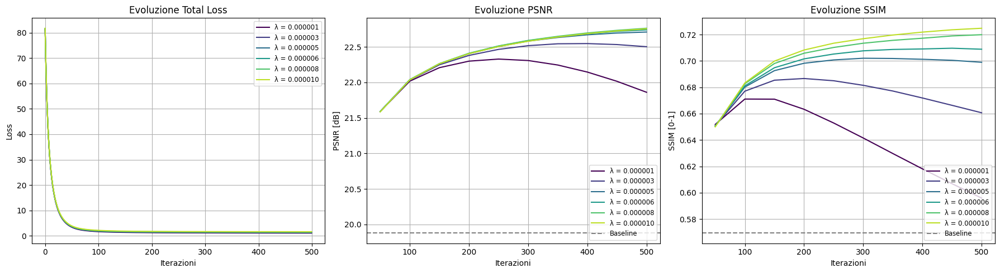

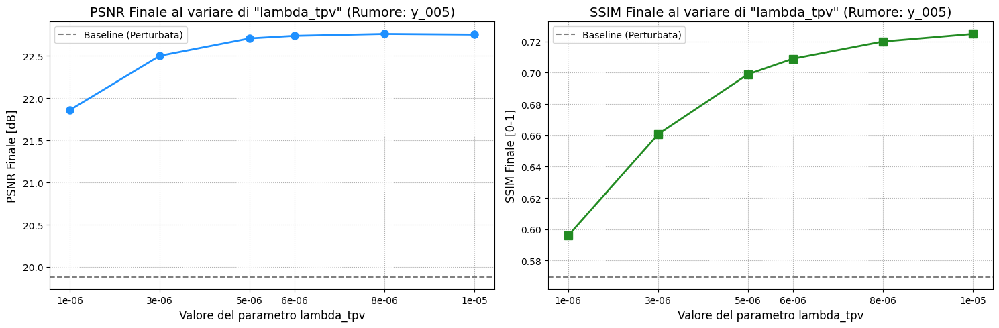

In [33]:
import matplotlib.cm as cm

# Calculate the baseline starting metrics comparing the degraded image with the ground truth
psnr_start, ssim_start = compute_metrics(y_noisy, x_clean)

# Generate an array of values for the 'lambda_tpv' parameter (regularization weight)
# We test 6 values uniformly spaced between 1e-6 and 1e-5
# Uncomment the list below if you want to explore non-linear orders of magnitude manually
# lambda_values = [0.0001, 0.0002, 0.0003, 0.0004, 0.0005, 0.0006, 0.0007, 0.001, 0.002]
lambda_values = np.linspace(0.000001, 0.00001, 6)

# Round the lambda values to 6 decimal places to avoid Python's floating-point precision artifacts
for i in range(len(lambda_values)):
  lambda_values[i] = round(lambda_values[i], 6)

# Dictionary to store the optimization results for each tested lambda
results_lambda = {}

print(f"Starting Tuning for the 'lambda_tpv' parameter on the image with noise level {noise_key}...\n")

for l_val in lambda_values:
    print(f"--- Optimization with lambda_tpv = {l_val:.6f} ---")

    # Run the TpV algorithm varying the regularization weight and keeping everything else constant
    x_reconstructed, history = deblur_denoise_tpv(
        y=y_noisy,
        K=blur,
        x_clean=x_clean,
        lambda_tpv=l_val,  # The parameter being tuned
        p=0.5,             # Keep the 'p' parameter fixed
        num_iters=500,     # Number of iterations for tuning
        lr=0.005,
        device=DEVICE
    )

    # Store the reconstructed image and its learning history for the current lambda
    results_lambda[l_val] = {
        'x_reconstructed': x_reconstructed,
        'history': history
    }


# PLOT 1: METRICS EVOLUTION OVER ITERATIONS

fig, axs = plt.subplots(1, 3, figsize=(18, 5))

# Use a continuous colormap (viridis) to smoothly color the lines representing different lambda values
colors = cm.viridis(np.linspace(0, 0.9, len(lambda_values)))

for i, l_val in enumerate(lambda_values):
    history = results_lambda[l_val]['history']
    c = colors[i]
    label = f'λ = {l_val:.6f}'

    # Plot the learning curves for each execution
    axs[0].plot(history['loss'], color=c, label=label)
    axs[1].plot(history['iters'], history['psnr'], color=c, label=label)
    axs[2].plot(history['iters'], history['ssim'], color=c, label=label)

# Setup subplots details (titles, labels, legends, grids)
axs[0].set_title('Total Loss Evolution')
axs[0].set_xlabel('Iterations')
axs[0].set_ylabel('Loss')
axs[0].legend(fontsize='small', loc='upper right')
axs[0].grid(True)

axs[1].axhline(y=psnr_start, color='gray', linestyle='--', label='Degraded Baseline')
axs[1].set_title('PSNR Evolution')
axs[1].set_xlabel('Iterations')
axs[1].set_ylabel('PSNR [dB]')
axs[1].legend(fontsize='small', loc='lower right')
axs[1].grid(True)

axs[2].axhline(y=ssim_start, color='gray', linestyle='--', label='Degraded Baseline')
axs[2].set_title('SSIM Evolution')
axs[2].set_xlabel('Iterations')
axs[2].set_ylabel('SSIM [0-1]')
axs[2].legend(fontsize='small', loc='lower right')
axs[2].grid(True)

plt.tight_layout()
plt.show()


# PLOT 2: FINAL SUMMARY GRAPHS

# Extract the final metric value reached at the last iteration for each tested lambda
final_psnr = [results_lambda[l_val]['history']['psnr'][-1] for l_val in lambda_values]
final_ssim = [results_lambda[l_val]['history']['ssim'][-1] for l_val in lambda_values]

fig, axs = plt.subplots(1, 2, figsize=(15, 5))

# --- Plot Final PSNR vs lambda ---
axs[0].plot(lambda_values, final_psnr, marker='o', markersize=8, color='dodgerblue', linewidth=2)
axs[0].axhline(y=psnr_start, color='gray', linestyle='--', label='Degraded Baseline')
axs[0].set_title(f'Final PSNR vs "lambda_tpv" (Noise: {noise_key})', fontsize=14)
axs[0].set_xlabel('Parameter "lambda_tpv" Value', fontsize=12)
axs[0].set_ylabel('Final PSNR [dB]', fontsize=12)
axs[0].grid(True, linestyle=':', which='both')

# Optional: Set the X-axis to logarithmic scale if testing wide ranges of magnitude
# axs[0].set_xscale('log')

axs[0].set_xticks(lambda_values)
axs[0].set_xticklabels([str(v) for v in lambda_values])
axs[0].legend()

# --- Plot Final SSIM vs lambda ---
axs[1].plot(lambda_values, final_ssim, marker='s', markersize=8, color='forestgreen', linewidth=2)
axs[1].axhline(y=ssim_start, color='gray', linestyle='--', label='Degraded Baseline')
axs[1].set_title(f'Final SSIM vs "lambda_tpv" (Noise: {noise_key})', fontsize=14)
axs[1].set_xlabel('Parameter "lambda_tpv" Value', fontsize=12)
axs[1].set_ylabel('Final SSIM [0-1]', fontsize=12)
axs[1].grid(True, linestyle=':', which='both')

# Optional: Set the X-axis to logarithmic scale
# axs[1].set_xscale('log')

axs[1].set_xticks(lambda_values)
axs[1].set_xticklabels([str(v) for v in lambda_values])
axs[1].legend()

plt.tight_layout()
plt.show()

## 3D "lambda_tpv" (Regularization Parameter) Evaluetion Over Multiple Images
In this cell, we evaluate the SSIM and PSNR metrics for multiple images with a fixed value of “p” in order to identify the optimal value of the “lambda_tpv” parameter. The results of this cell consist of two 3D plots for the two metrics, along with their mean, median, mode, and standard deviation.

Avvio Tuning su 520 immagini con p=0.5 al variare di lambda...

=== Elaborazione Immagine 1/520 ===
  > Ottimizzazione Lambda = 0.000 ... Fatto! (PSNR Max: 27.73 dB all'iterazione 270)
  > Ottimizzazione Lambda = 0.000 ... Fatto! (PSNR Max: 27.60 dB all'iterazione 240)
=== Elaborazione Immagine 2/520 ===
  > Ottimizzazione Lambda = 0.000 ... Fatto! (PSNR Max: 22.78 dB all'iterazione 300)
  > Ottimizzazione Lambda = 0.000 ... Fatto! (PSNR Max: 22.78 dB all'iterazione 300)
=== Elaborazione Immagine 3/520 ===
  > Ottimizzazione Lambda = 0.000 ... Fatto! (PSNR Max: 26.88 dB all'iterazione 300)
  > Ottimizzazione Lambda = 0.000 ... Fatto! (PSNR Max: 26.74 dB all'iterazione 300)
=== Elaborazione Immagine 4/520 ===
  > Ottimizzazione Lambda = 0.000 ... Fatto! (PSNR Max: 26.70 dB all'iterazione 300)
  > Ottimizzazione Lambda = 0.000 ... Fatto! (PSNR Max: 26.74 dB all'iterazione 300)
=== Elaborazione Immagine 5/520 ===
  > Ottimizzazione Lambda = 0.000 ... Fatto! (PSNR Max: 29.72 dB all'iterazi

/tmp/ipykernel_4549/819188422.py:100: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


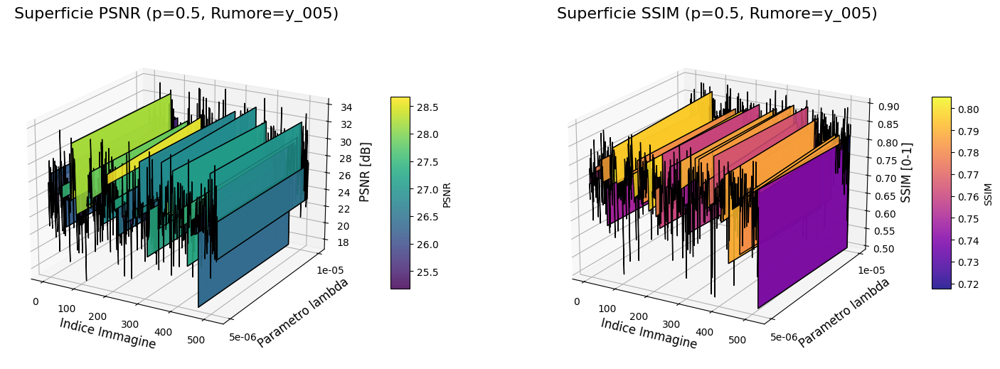

=== RISULTATI GLOBALI ===

--- Analisi PSNR ---
Miglior Lambda (MEDIA):   5e-06 (PSNR medio: 26.70 ± 2.97 dB) [Raggiunto all'iterazione media: 242]
Miglior Lambda (MEDIANA): 1e-05 (PSNR mediano: 26.66 dB) [Raggiunto all'iterazione media: 244]
Miglior Lambda (MODA):    5e-06 (Ha vinto su 391/520 img) [Raggiunto all'iterazione media: 242]
Dev. Std. dei Lambda scelti singolarmente dalle immagini: ± 0.000002

--- Analisi SSIM ---
Miglior Lambda (MEDIA):   1e-05 (SSIM medio: 0.773173 ± 0.071854) [Raggiunto all'iterazione media: 253]
Miglior Lambda (MEDIANA): 1e-05 (SSIM mediano: 0.784575) [Raggiunto all'iterazione media: 253]
Miglior Lambda (MODA):    1e-05 (Ha vinto su 275/520 img) [Raggiunto all'iterazione media: 253]
Dev. Std. dei Lambda scelti singolarmente dalle immagini: ± 0.000002


In [18]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy import stats

p_val = 0.5

# Define the number of different images to test (e.g., all the images in the test set)
num_images = len(final_dataset['test'])
ds_degraded = final_dataset['test']
image_indices = np.arange(num_images)

# List of lambda_tpv values to explore during the grid search
lambda_values = [0.000005, 0.00001]

# Create a 2D meshgrid for 3D surface plotting
I_mesh, L_mesh = np.meshgrid(image_indices, lambda_values)

# Arrays to store the MAXIMUM values of PSNR/SSIM achieved during the optimization
Z_psnr = np.zeros_like(I_mesh, dtype=float)
Z_ssim = np.zeros_like(I_mesh, dtype=float)

# NEW ARRAYS: To store the exact iteration at which the maximum metric was achieved
Z_psnr_iters = np.zeros_like(I_mesh, dtype=int)
Z_ssim_iters = np.zeros_like(I_mesh, dtype=int)

print(f"Starting Tuning on {num_images} images with p={p_val} while varying lambda...\n")

for idx in range(num_images):
    # Load the specific image sample from the degraded dataset
    sample = ds_degraded[int(idx)]
    x_clean = pil_to_tensor(sample['x']).unsqueeze(0).to(DEVICE).float()
    y_noisy = pil_to_tensor(sample[noise_key]).unsqueeze(0).to(DEVICE).float()

    print(f"=== Processing Image {idx+1}/{num_images} ===")

    for i, l_val in enumerate(lambda_values):
        print(f"  > Optimizing with Lambda = {l_val:.6f} ...", end=" ")

        # Run the TpV algorithm
        x_reconstructed, history = deblur_denoise_tpv(
            y=y_noisy,
            K=blur,
            x_clean=x_clean,
            lambda_tpv=l_val,
            p=p_val,
            num_iters=300,
            lr=0.01,
            device=DEVICE
        )

        # Get the index of the highest PSNR achieved in the entire history
        best_psnr_idx = np.argmax(history['psnr'])
        Z_psnr[i, idx] = history['psnr'][best_psnr_idx]
        Z_psnr_iters[i, idx] = history['iters'][best_psnr_idx]

        # Get the index of the highest SSIM achieved in the entire history
        best_ssim_idx = np.argmax(history['ssim'])
        Z_ssim[i, idx] = history['ssim'][best_ssim_idx]
        Z_ssim_iters[i, idx] = history['iters'][best_ssim_idx]

        print(f"Done! (Max PSNR: {Z_psnr[i, idx]:.4f} dB at iteration {Z_psnr_iters[i, idx]})")

print("\nOptimizations completed. Generating 3D graphs...")


# 3D SURFACE PLOTS

fig = plt.figure(figsize=(18, 7))

# Apply Log10 to the Lambda axis to prevent visual clustering/compression of values
L_log = np.log10(L_mesh)

# --- 3D PSNR GRAPH ---
ax1 = fig.add_subplot(121, projection='3d')
surf1 = ax1.plot_surface(I_mesh, L_log, Z_psnr, cmap='viridis', edgecolor='k', alpha=0.85)

ax1.set_title(f'PSNR Surface (p={p_val}, Noise={noise_key})', fontsize=16)
ax1.set_xlabel('Image Index', fontsize=12)
ax1.set_ylabel('Lambda parameter (log scale)', fontsize=12)
ax1.set_zlabel('PSNR [dB]', fontsize=12)

# Optional: Disable X ticks if there are too many images
# ax1.set_xticks(image_indices)
ax1.set_yticks(np.log10(lambda_values))
ax1.set_yticklabels([str(v) for v in lambda_values])

# Display the colorbar mapped specifically to this axis (ax=ax1)
fig.colorbar(surf1, ax=ax1, shrink=0.5, aspect=10, pad=0.1, label='PSNR')

# --- 3D SSIM GRAPH ---
ax2 = fig.add_subplot(122, projection='3d')
surf2 = ax2.plot_surface(I_mesh, L_log, Z_ssim, cmap='plasma', edgecolor='k', alpha=0.85)

ax2.set_title(f'SSIM Surface (p={p_val}, Noise={noise_key})', fontsize=16)
ax2.set_xlabel('Image Index', fontsize=12)
ax2.set_ylabel('Lambda parameter (log scale)', fontsize=12)
ax2.set_zlabel('SSIM [0-1]', fontsize=12)

# Optional: Disable X ticks if there are too many images
# ax2.set_xticks(image_indices)
ax2.set_yticks(np.log10(lambda_values))
ax2.set_yticklabels([str(v) for v in lambda_values])

# Display the colorbar mapped specifically to this axis (ax=ax2)
fig.colorbar(surf2, ax=ax2, shrink=0.5, aspect=10, pad=0.1, label='SSIM')

# Adjust the viewing angle for better 3D perspective
ax1.view_init(elev=20, azim=-60)
ax2.view_init(elev=20, azim=-60)

plt.tight_layout()
plt.show()


# BEST PARAMETERS EXTRACTION AND ITERATIONS


# 1. MEAN-BASED CALCULATION
# Calculate the mean and standard deviation across all images (axis 1) for each lambda
mean_psnr = np.mean(Z_psnr, axis=1)
mean_ssim = np.mean(Z_ssim, axis=1)
std_psnr = np.std(Z_psnr, axis=1)
std_ssim = np.std(Z_ssim, axis=1)

# Find the index of the lambda that produced the highest mean metric
idx_best_mean_psnr = np.argmax(mean_psnr)
idx_best_mean_ssim = np.argmax(mean_ssim)

# Retrieve the actual best lambda value
best_lambda_mean_psnr = lambda_values[idx_best_mean_psnr]
best_lambda_mean_ssim = lambda_values[idx_best_mean_ssim]

# Calculate the AVERAGE ITERATION at which the winning lambda reached its peak
avg_iter_mean_psnr = np.mean(Z_psnr_iters[idx_best_mean_psnr, :])
avg_iter_mean_ssim = np.mean(Z_ssim_iters[idx_best_mean_ssim, :])

# 2. MEDIAN-BASED CALCULATION (Robust to outliers)
median_psnr = np.median(Z_psnr, axis=1)
median_ssim = np.median(Z_ssim, axis=1)

idx_best_median_psnr = np.argmax(median_psnr)
idx_best_median_ssim = np.argmax(median_ssim)

best_lambda_median_psnr = lambda_values[idx_best_median_psnr]
best_lambda_median_ssim = lambda_values[idx_best_median_ssim]

avg_iter_median_psnr = np.mean(Z_psnr_iters[idx_best_median_psnr, :])
avg_iter_median_ssim = np.mean(Z_ssim_iters[idx_best_median_ssim, :])

# 3. MODE-BASED CALCULATION (Which lambda won on the highest number of individual images)
best_idx_per_img_psnr = np.argmax(Z_psnr, axis=0)
best_idx_per_img_ssim = np.argmax(Z_ssim, axis=0)

mode_psnr_idx = stats.mode(best_idx_per_img_psnr, keepdims=False).mode
mode_ssim_idx = stats.mode(best_idx_per_img_ssim, keepdims=False).mode

best_lambda_mode_psnr = lambda_values[mode_psnr_idx]
best_lambda_mode_ssim = lambda_values[mode_ssim_idx]

avg_iter_mode_psnr = np.mean(Z_psnr_iters[mode_psnr_idx, :])
avg_iter_mode_ssim = np.mean(Z_ssim_iters[mode_ssim_idx, :])

# 4. LAMBDA STANDARD DEVIATION (Measures how much the images disagree on the best parameter)
best_lambdas_psnr_array = np.array([lambda_values[i] for i in best_idx_per_img_psnr])
best_lambdas_ssim_array = np.array([lambda_values[i] for i in best_idx_per_img_ssim])

std_lambda_psnr = np.std(best_lambdas_psnr_array)
std_lambda_ssim = np.std(best_lambdas_ssim_array)



# FINAL PRINTING OF GLOBAL RESULTS

print("=== GLOBAL RESULTS ===")

print("\n--- PSNR Analysis ---")
print(f"Best Lambda (MEAN):   {best_lambda_mean_psnr} (Mean PSNR: {np.max(mean_psnr):.2f} ± {std_psnr[idx_best_mean_psnr]:.2f} dB) [Reached at average iteration: {avg_iter_mean_psnr:.0f}]")
print(f"Best Lambda (MEDIAN): {best_lambda_median_psnr} (Median PSNR: {np.max(median_psnr):.2f} dB) [Reached at average iteration: {avg_iter_median_psnr:.0f}]")
print(f"Best Lambda (MODE):   {best_lambda_mode_psnr} (Won on {np.sum(best_idx_per_img_psnr == mode_psnr_idx)}/{num_images} img) [Reached at average iteration: {avg_iter_mode_psnr:.0f}]")
print(f"Standard Deviation of 'Ideal Lambdas' chosen individually by images: ± {std_lambda_psnr:.6f}")

print("\n--- SSIM Analysis ---")
print(f"Best Lambda (MEAN):   {best_lambda_mean_ssim} (Mean SSIM: {np.max(mean_ssim):.6f} ± {std_ssim[idx_best_mean_ssim]:.6f}) [Reached at average iteration: {avg_iter_mean_ssim:.0f}]")
print(f"Best Lambda (MEDIAN): {best_lambda_median_ssim} (Median SSIM: {np.max(median_ssim):.6f}) [Reached at average iteration: {avg_iter_median_ssim:.0f}]")
print(f"Best Lambda (MODE):   {best_lambda_mode_ssim} (Won on {np.sum(best_idx_per_img_ssim == mode_ssim_idx)}/{num_images} img) [Reached at average iteration: {avg_iter_mode_ssim:.0f}]")
print(f"Standard Deviation of 'Ideal Lambdas' chosen individually by images: ± {std_lambda_ssim:.6f}")
